In [1]:
im_file = 'data/example_1.tif'

# Old School Image Analysis with OpenCV

In [63]:
%matplotlib notebook
%load_ext autoreload
%autoreload 2

import numpy as np
import cv2
import matplotlib.pyplot as plt
from img_utils import *
from cv_utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Lesson 1: Images are Arrays

with values ranging from 0 to 255 (256 values for each **channel**).

Color images have 3 channels: R,G,B - and so their array has shape (3,height,width)

Grayscale images have 1 channel and shape (height,width)

In [3]:
# Load a color image in grayscale
img = cv2.imread(im_file,0)

In [4]:
print(img.shape)
img

(512, 512)


array([[ 15,  23,  21, ...,  83,  61,  78],
       [ 77,  80,  34, ...,  90,  63,  58],
       [116, 134,  60, ...,  58,  61,  64],
       ...,
       [ 83, 115, 112, ...,  48,  31,  36],
       [ 68, 112, 117, ...,  29,  28,  38],
       [102, 145, 135, ...,  33,  17,  14]], dtype=uint8)

<IPython.core.display.Javascript object>


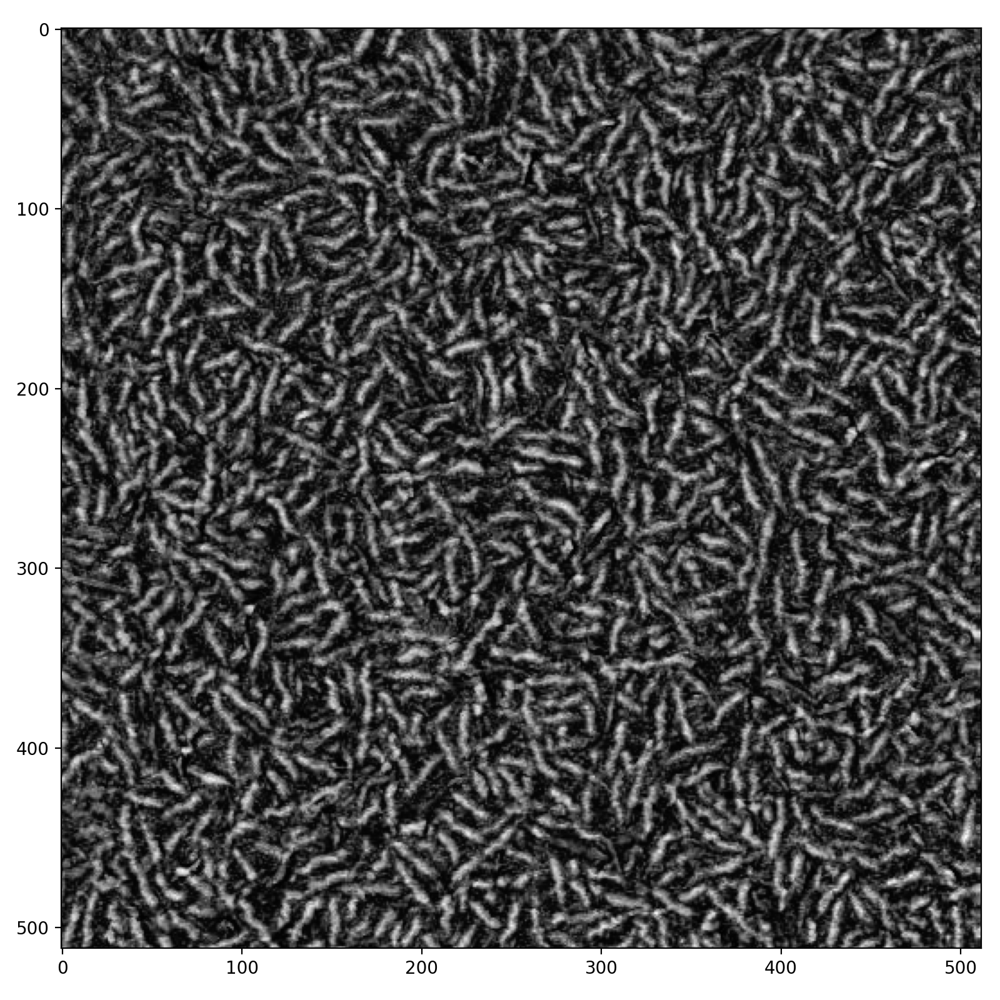

In [5]:
imshow(img, figsize=(8,8));

#### Move your cursor around the image to see the actual values of the array

### These are polymer nanofibers

This is one of hundreds of images from my PhD thesis work. It's an AFM image from the surface of an organic field effect transistor. The actual width of this image is 5µm - the fibers are polymer nanofibers that are formed through the crystallization of poly(3-hexylthiophene), a polymer semiconductor.

![P3HT nanofibers](data/P3HT.png)

During my PhD, I developed [software](https://gtfiber.github.io) to automatically extract fibers from images like this and analyze their structure (length, width, orientation distributions), then correlated those structural features with the thin films' processing and electrical properties. The following are some of the basic techniques of image processing that I learned while developing this analysis pipeline.

## Lesson 2: Binary arrays are way easier to work with

Doing any kind of meaningful analysis on a grayscale image is extremely difficult. In our example image, we're really only interested in one thing: is a pixel part of a fiber, or part of the background? Essentially, we are trying to classify each pixel *(how might deep learning be applied to this problem?)*. This is referred to as "binarization" when it's just foreground vs. background, but can also be referred to as "segmentation" when there are more categories into which a pixel could be classified.

### Thresholding algorithms convert a grayscale image array into a binary image array

The following figure shows how different [thresholding algorithms](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_thresholding/py_thresholding.html#thresholding) work on the task of binarizing a Sudoku puzzle from a newspaper:

![thresholding algos](data/ada_threshold.jpg)

As you can see, "global" thresholding says "any pixel brighter than *v* becomes white, anything darker becomes black". This is extremely naive and only works on the most basic examples. When background color varies across the image, one is usually forced to use an adaptive threshold, which assigns white/black by considering each pixel's brightness relative to its neighbors, rather than absolute values. Let's see how this work on our example.

<IPython.core.display.Javascript object>


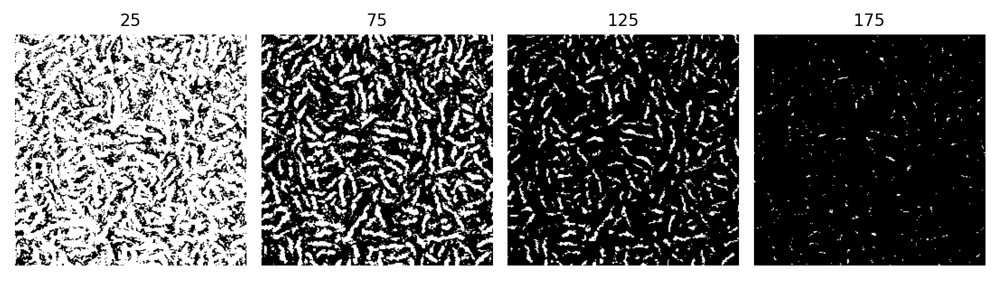

In [6]:
thresh_vals = [25,75,125,175]
global_thresh_series = [
    cv2.threshold(img,val,255,cv2.THRESH_BINARY)[1]
    for val in thresh_vals
]
n_imshow(global_thresh_series,
         titles=thresh_vals,
         zoom=0.5);

## 75 looks pretty good. Let's take a closer look:

<IPython.core.display.Javascript object>


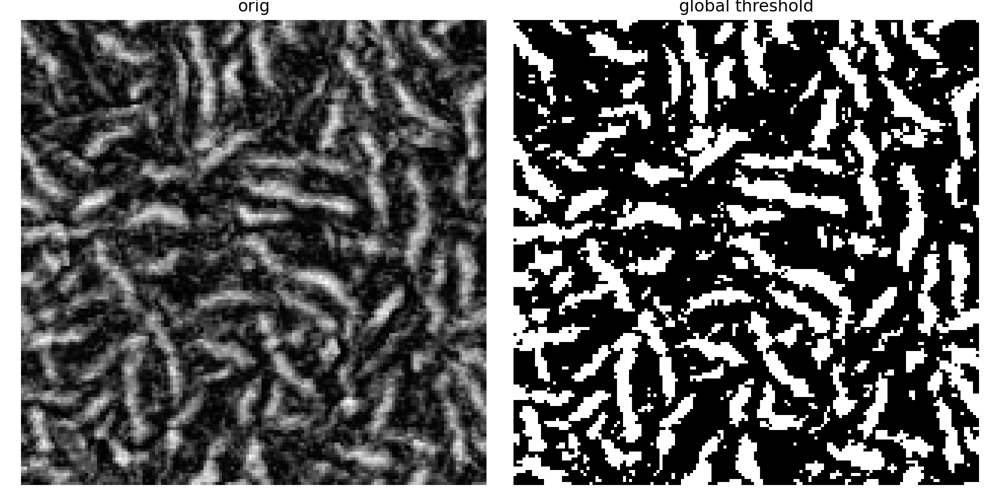

In [7]:
n_imshow([img, global_thresh_series[1]],
         figsize=(10,5),
         titles=['orig','global threshold'],
         zoom=0.7);

## Compare that to an adaptive Gaussian threshold

<IPython.core.display.Javascript object>


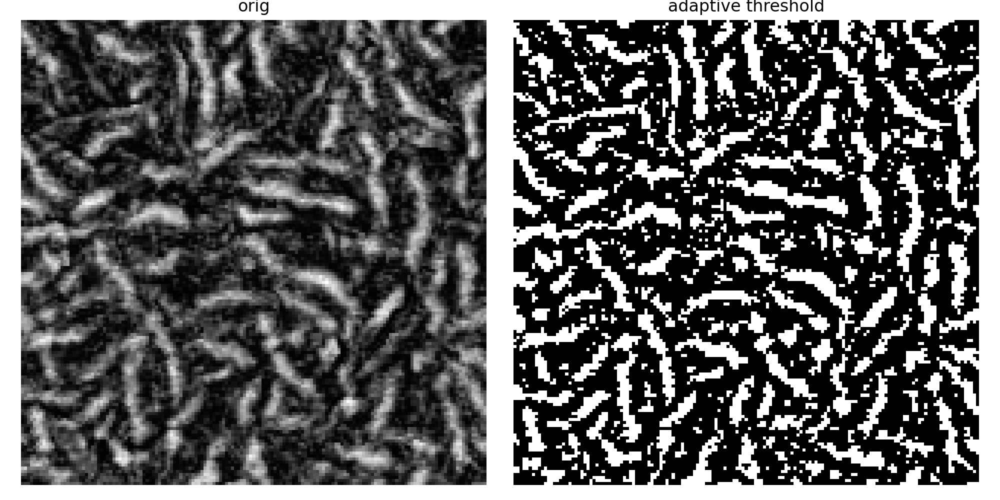

In [8]:
ada_thresh = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,15,-13)
n_imshow([img, ada_thresh],
         figsize=(10,5),
         titles=['orig','adaptive threshold'],
         zoom=0.7);

### Neither of these are perfect

And that's usually the case with heuristic image processing. To get to the desired result, there are usually a series of steps that progressively refine the signal/noise ratio. The key is to preserve as much signal as possible with each step. I would argue here that while the adaptive threshold has more background noise (it looks "dirtier"), it's capturing more of the fiber signal: fainter fibers show up better and the width is more accurate (if we wanted to measure that).

We can clean up the "salt and pepper noise" in other ways. One of them is through **smoothing filters**.

## Lesson 3: Smoothing Filters

Smoothing filters are carried out mathematically through convolutions with some kind of kernel (or "window"). Essentially, each pixel alters its value based on its neighbors' values. You can think of a kernel as a local probability mass function: its values must sum to 1, so that the overall brightness of the image is preserved. A common smoothing filter is a **Gaussian Filter**: each pixel becomes the weighted mean of the values of its neighboring pixels, with weights assigned by a discretized 2-D Gaussian:

![gaussian filter](data/gaussian_algo.png)

(Image credit [Sylvain Paris, MIT](http://people.csail.mit.edu/sparis/bf_course/))

### Let's see how our global thresholding performs after a Gaussian Filter

<IPython.core.display.Javascript object>


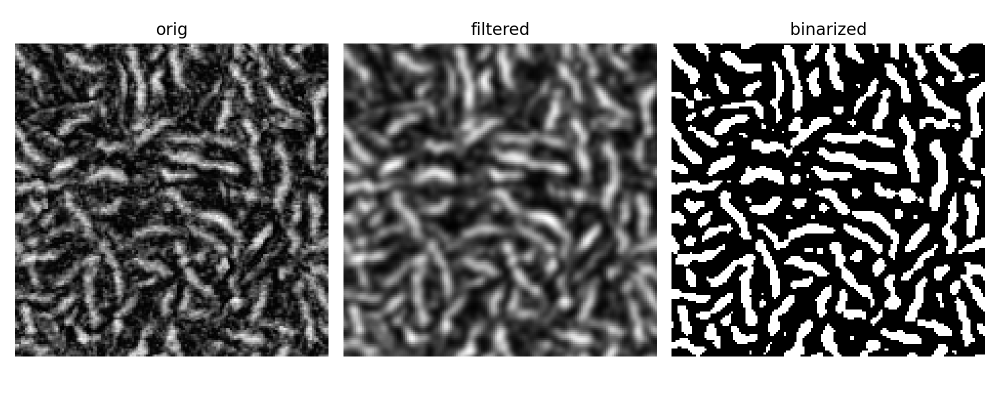

In [9]:
gauss = cv2.GaussianBlur(img,(7,7),0)
# bw = cv2.threshold(gauss,75,255,cv2.THRESH_BINARY)[1]
bw = cv2.adaptiveThreshold(gauss,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,15,-5)
n_imshow([img,gauss,bw],figsize=(10,4),
         titles=['orig','filtered','binarized'],
         zoom=0.7);

### Wow, that knocked out a lot of the background noise, and it made the fibers themselves clearer.

There's only a small amount of noise remaining, and we can deal with that using [**morphological transformations**](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_morphological_ops/py_morphological_ops.html#morphological-ops).

## Lesson 4: Morphological Image Transformations

Once your image is in a binarized (black-and-white) format, there are numerous clever algorithms that can perform further refinement and ultimately analysis. The first are **dilation** and **erosion**.

|Original                |Dilated                      |Eroded                     |
|------------------------|-----------------------------|---------------------------|
|![orig](data/j_orig.png)|![dilated](data/dilation.png)|![eroded](data/erosion.png)|

These are usually accomplished by sliding a kernel over the image and applying it _only where it encounters white pixels_. You can use these operations in succession to achieve more useful results. The two most basic combinations are:

- **opening**: Erosion followed by dilation. Useful for removing small noise flecks (how?)
- **closing**: Dilation followed by erosion. Useful for filling in tiny pinholes

|Opening                  |Closing                   |
|-------------------------|--------------------------|
|![open](data/opening.png)|![close](data/closing.png)|

<IPython.core.display.Javascript object>


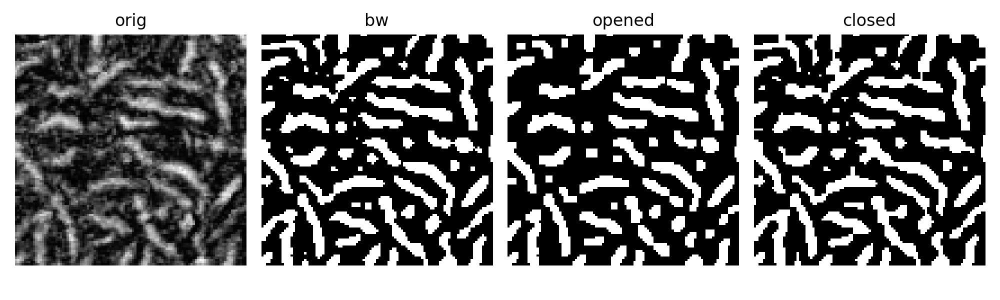

In [10]:
kernel = np.ones((3,3), dtype=np.uint8)
opening = cv2.morphologyEx(bw, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(bw, cv2.MORPH_CLOSE, kernel)

n_imshow([img, bw, opening, closing],
         titles = ['orig', 'bw', 'opened', 'closed'],
         zoom=0.8);

### Let's use the "opened" image because it's free of small specks.

## Lesson 5: Contour Analysis

Now that we have a binarized image full of well-defined objects, we can perform some analysis on them. The most common and straightforward is referred to as contour analysis (or connected component analysis). Contours are outlines of groups of white pixels that are connected to one another.

Once contours are identified, you can calculate many different [properties](https://docs.opencv.org/master/d1/d32/tutorial_py_contour_properties.html) on them:
- area
- aspect ratio
- extent (how much of its *bounding box* does it occupy?)
- solidity (how much of its *convex hull* does it occupy?)
- orientation
- etc.

OpenCV has a function called `findContours` that identifies these contours. The contours are stored as lists of pixel coordinates.

In [59]:
bw_copy = opening
contours, hierarchy = cv2.findContours(bw_copy,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
print(f"Found {len(contours)} contours")

Found 1285 contours


### We can visualize the contours of our binarized image by drawing the outlines

<IPython.core.display.Javascript object>


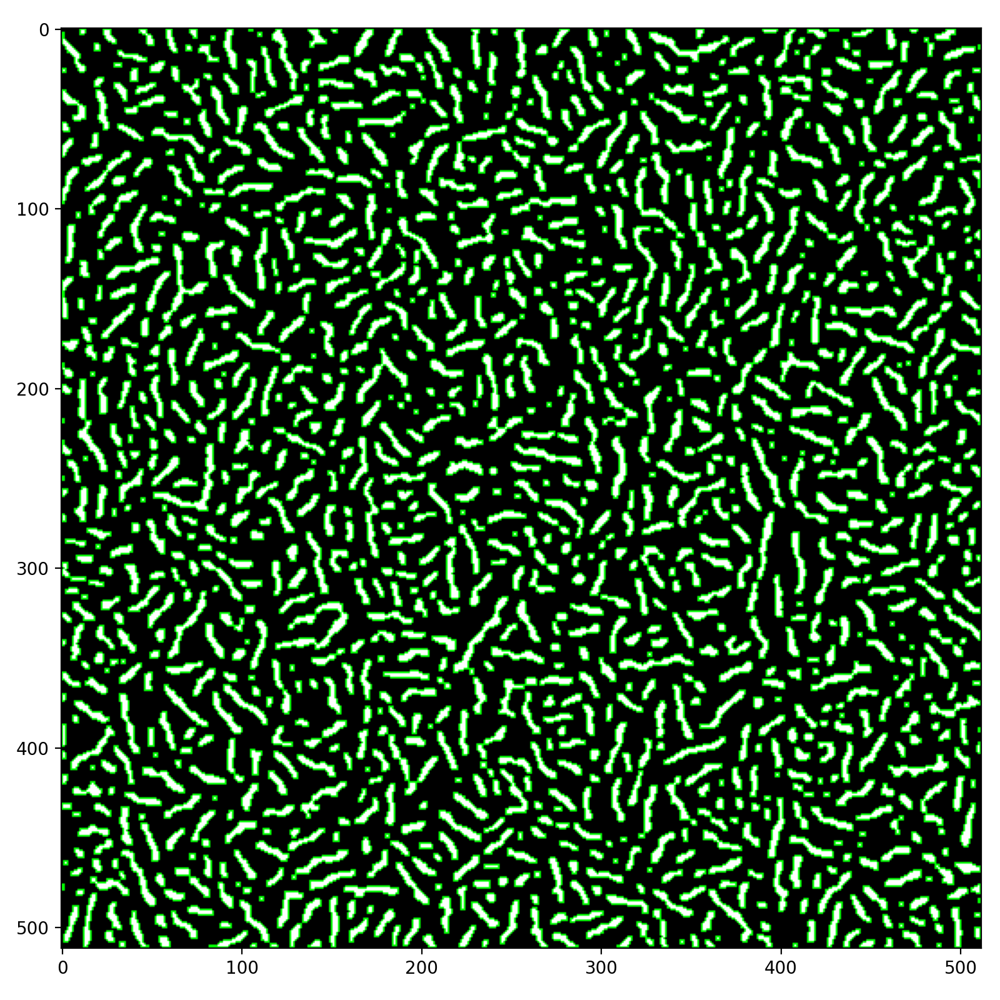

In [60]:
rgb_thresh = cv2.cvtColor(opening,cv2.COLOR_GRAY2RGB)
img_contours = cv2.drawContours(rgb_thresh, contours, -1, (0,255,0), 1)
imshow(img_contours, figsize=(8,8));

### Finally, we can calculate the relevant properties for each contour and store them in a DataFrame

In [65]:
df_cp = contour_properties(contours)
df_cp.head(3)

,Area,Perimeter,Aspect Ratio,Extent,Solidity,Ellipse Center,Ellipse Major Axis,Ellipse Minor Axis,Orientation,Eccentricity,contour
0,4,4,1,0.444444,1,NaN,NaN,NaN,NaN,NaN,"[[[487, 509]], [[487, 511]], [[489, 511]], [[4..."
1,4,4,1,0.444444,1,NaN,NaN,NaN,NaN,NaN,"[[[407, 509]], [[407, 511]], [[409, 511]], [[4..."
2,5.5,5,1.33333,0.458333,1,"(106.6956558227539, 510.2173767089844)",3.7374,2.79441,67.5,0.144369,"[[[106, 509]], [[105, 510]], [[105, 511]], [[1..."


### Let's filter our contours for some really "fibrillar" ones

I'll define "fibrillar" as being both highly eccentric and having as large an area as possible (i.e. exclude trivial eccentric contours that are just 3 pixels in a row or whatever).

I provided a utility function `show_contour` that crops the original image and shows the outlined contour so we can visualize different properties.

In [66]:
df_cp.query('Eccentricity>0.7').sort_values('Area',ascending=False).head(5)

,Area,Perimeter,Aspect Ratio,Extent,Solidity,Ellipse Center,Ellipse Major Axis,Ellipse Minor Axis,Orientation,Eccentricity,contour
693,144,47,0.487179,0.194332,0.650113,"(393.0330505371094, 247.4356231689453)",39.6022,6.27447,157.661,0.726464,"[[[384, 228]], [[384, 232]], [[385, 233]], [[3..."
684,135,35,2.92308,0.273279,0.666667,"(270.7867126464844, 237.27767944335938)",41.8492,5.80387,102.468,0.756412,"[[[252, 231]], [[252, 234]], [[253, 234]], [[2..."
588,127,33,0.263158,0.334211,0.725714,"(391.3111267089844, 286.258056640625)",39.8088,5.22245,9.80665,0.768052,"[[[394, 269]], [[393, 270]], [[393, 271]], [[3..."
563,120,35,0.371429,0.263736,0.6469,"(142.06936645507812, 296.78900146484375)",36.687,5.87305,165.816,0.724011,"[[[136, 280]], [[136, 284]], [[137, 285]], [[1..."
285,117,41,2.1875,0.208929,0.659155,"(352.61419677734375, 401.55426025390625)",35.5574,5.67677,70.4221,0.724657,"[[[366, 394]], [[366, 395]], [[365, 396]], [[3..."


<IPython.core.display.Javascript object>


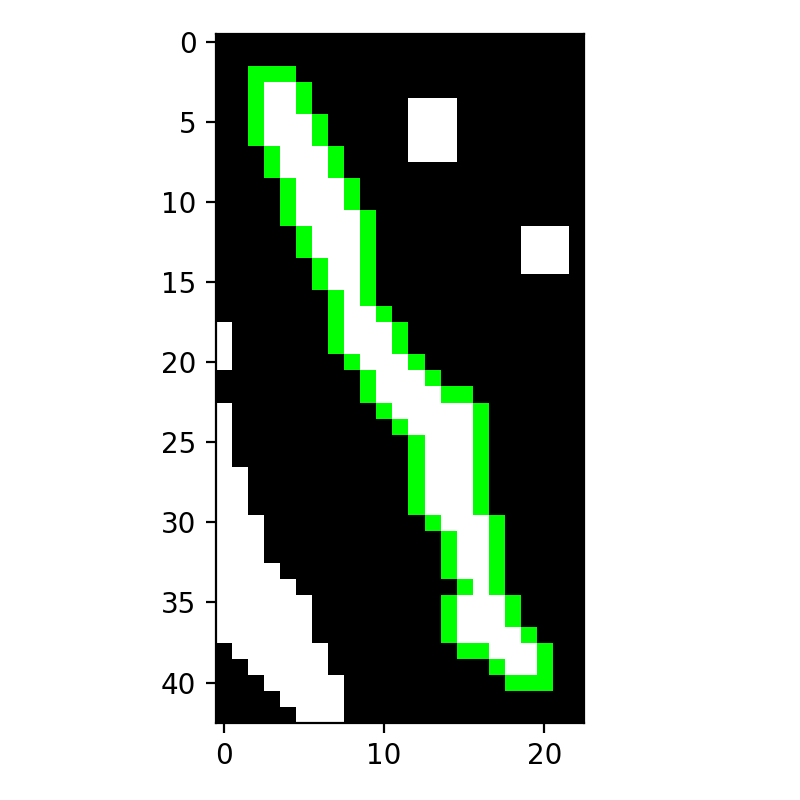

In [69]:
show_contour(opening,df_cp.loc[693,'contour']);

### Try plotting different contours from the DataFrame

(just change `647` to another row number in the cell above)

## Lesson 6: Getting data from images

Given our database of contour properties, we can now calculate higher-order properties of the objects in our image, like their orientation distribution.

Let's get contours whose Area is greater than 30 so that our analysis doesn't include trivial objects...

In [83]:
df_fibers = df_cp.query('Area>30')
len(df_fibers)

722

<IPython.core.display.Javascript object>


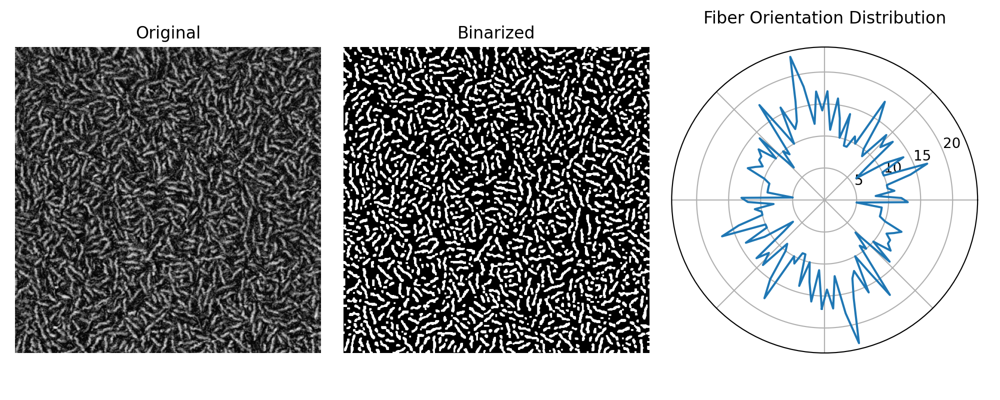

Text(0.5, 1.0, 'Binarized')

In [104]:
counts, angles = np.histogram(df_fibers['Orientation'].dropna(), bins=np.linspace(0,180,61))
angles = (angles[:-1]+angles[1:])/2
counts = np.hstack([counts, counts, counts[0:1]])
angles = -np.deg2rad(np.hstack([angles, angles+180, angles[0:1]])+90)

f = plt.figure(figsize=(10,4),tight_layout=True)

f.add_subplot(1,3,3,polar=True)
plt.polar(angles,counts,linewidth=1.5)
ax=plt.gca()
ax.set_xticklabels([]);
plt.title('Fiber Orientation Distribution')

f.add_subplot(1,3,1)
ax=plt.gca()
imshow(img,axis='off',ax=ax)
plt.title('Original')

f.add_subplot(1,3,2)
ax=plt.gca()
imshow(opening,axis='off',ax=ax)
plt.title('Binarized')

## To verify, let's run the whole pipeline on a more oriented example

In [105]:
def analyze_orientation(im_file):
    '''Given an image file, run our analysis pipeline to extract
    orientation distribution
    '''
    
    # Read in file, blur and binarize
    img = cv2.imread(im_file,0)
    gauss = cv2.GaussianBlur(img,(7,7),0)
    bw = cv2.adaptiveThreshold(gauss,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,15,-5)
    
    # Apply "binarized"
    kernel = np.ones((3,3), dtype=np.uint8)
    binarized = cv2.morphologyEx(bw, cv2.MORPH_OPEN, kernel)
    
    # Find and analyze contours
    bw_copy = binarized
    contours, hierarchy = cv2.findContours(bw_copy,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    df_cp = contour_properties(contours)
    df_fibers = df_cp.query('Area>30')

    # Make the orientation distribution plot
    counts, angles = np.histogram(df_fibers['Orientation'].dropna(), bins=np.linspace(0,180,61))
    angles = (angles[:-1]+angles[1:])/2
    counts = np.hstack([counts, counts, counts[0:1]])
    angles = -np.deg2rad(np.hstack([angles, angles+180, angles[0:1]])+90)

    f = plt.figure(figsize=(10,4),tight_layout=True)

    f.add_subplot(1,3,3,polar=True)
    plt.polar(angles,counts,linewidth=1.5)
    ax=plt.gca()
    ax.set_xticklabels([]);
    plt.title('Fiber Orientation Distribution')

    f.add_subplot(1,3,1)
    ax=plt.gca()
    imshow(img,axis='off',ax=ax)
    plt.title('Original')

    f.add_subplot(1,3,2)
    ax=plt.gca()
    imshow(binarized,axis='off',ax=ax)
    plt.title('Binarized')
    
    return binarized, df_cp

<IPython.core.display.Javascript object>


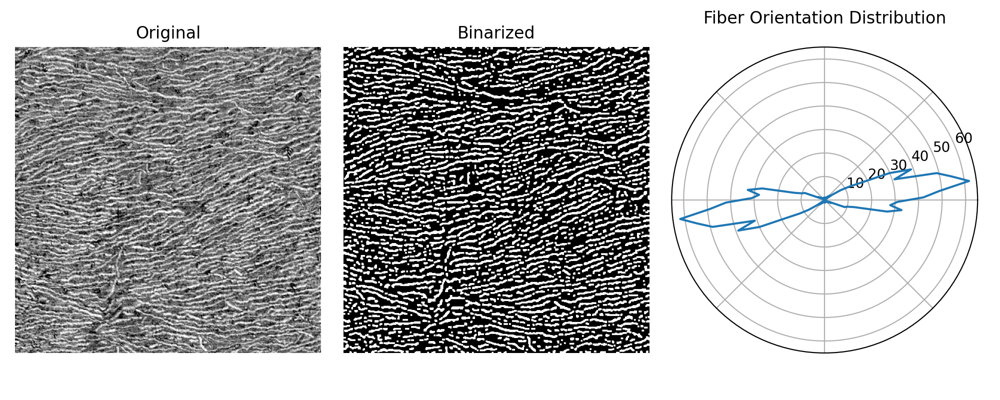

In [111]:
analyze_orientation('data/example_2.tif');

# Sweet!